# Topic modelling and Sentiment Analysis on Gamestop Tweets

### Introduction

In January 2021, there was a short-position squeeze of US video game retailer GameStop and other stocks on various stock exchanges, leading to significant financial consequences for certain hedge funds. The short contraction increased the retailer's share price nearly 190 times from its all-time low of 2.57 dollar to nearly 500 dollar a share, causing large losses for short sellers. About 140 percent of GameStop's shares had been sold short, and the rush to buy shares to cover those positions as the price rose pushed the price even higher. The brief squeeze was initially and primarily triggered by users of the WallStreetBets Internet forum on Reddit.

In this analysis we are going to apply 2 text mining methods Topic Modelling and Sentiment analysis to tweets from 01-02-2021-
02-02-2021.

In [179]:
import datetime as dt
import matplotlib.pyplot as plt
from matplotlib import style
import pandas as pd
import pandas_datareader.data as web

style.use('ggplot')

start = dt.datetime(2021, 1, 1)
end = dt.datetime.now()

gmestock = web.DataReader("GME", 'yahoo', start, end)
gmestock.reset_index(level=0, inplace=True)

gmestock.head()

,Date,High,Low,Open,Close,Volume,Adj Close
0,2021-01-04,19.100000,17.15,19.000000,17.250000,10022500,17.250000
1,2021-01-05,18.080000,17.23,17.350000,17.370001,4961500,17.370001
2,2021-01-06,18.980000,17.33,17.340000,18.360001,6056200,18.360001
3,2021-01-07,19.450001,18.02,18.469999,18.080000,6129300,18.080000
4,2021-01-08,18.299999,17.08,18.180000,17.690001,6464500,17.690001


In [655]:
# Using plotly.express
import plotly.express as px
plotly.offline.init_notebook_mode()

fig = px.line(gmestock, x='Date', y="Close", title= "GME Stock")
fig.show()


### Importing Libraries

In [177]:
# Import Libraries

import pandas as pd
import numpy as np
import datetime
import os
import re
import string
import json

import nltk
nltk.download('stopwords')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from nltk.sentiment.vader import SentimentIntensityAnalyzer

from wordcloud import WordCloud, STOPWORDS
from PIL import Image
from langdetect import detect
import tweepy
import sklearn
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation


import matplotlib.pyplot as plt
%matplotlib inline 


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Can\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Gathering tweets

In order to pull tweets from twitter, we decided to use tweepy library. Firstly we needed keys for using twitter API, so applied for developer account from twitter. After revieving keys we started to pull twitts 25k tweets per day. Since twitter API has 3200 limit we set wait_on_rate_limit=True in order tweepy to wait 15 min every time it reaches to the limit.

In [157]:
# Authentication
consumerKey = "Private key"
consumerSecret = "Private key"
accessToken = "Private key"
accessTokenSecret = "Private key"

auth = tweepy.OAuthHandler(consumerKey, consumerSecret)
auth.set_access_token(accessToken, accessTokenSecret)
api = tweepy.API(auth, wait_on_rate_limit=True)

Searching and gethering for the keyword Gamestop for 1st and 2nd of February in order to do anaylsis on the time when price of stocks started to decrease.

We want to see if we can find some changes in the trend. While stock price is decreasing sentiment of tweets are changing as well or not.

In [16]:
tweets = tweepy.Cursor(api.search, q="Gamestop -filter:retweets since:2021-01-29 until:2021-02-02", lang ="en").items(25000)

In [17]:
%%time
tweetss = []
tweet_list = []
tweet_date = []
tweet_rt = []
tweet_fav = []


for tweet in tweets:
    tweet_list.append(tweet.text)
    tweet_date.append(tweet.created_at)
    tweetss.append(tweet)
    tweet_rt.append(tweet.retweet_count)
    tweet_fav.append(tweet.favorite_count)
    
gamestop = pd.DataFrame({"tweets":tweet_list,"date":tweet_date,"rt":tweet_rt,"fav":tweet_fav})

Wall time: 2h 16min 14s


In [18]:
gamestop.to_csv("gamestop_tweets_01-02-2021.csv")

In [158]:
tweets = tweepy.Cursor(api.search, q="Gamestop -filter:retweets since:2021-01-29 until:2021-02-03", lang ="en").items(25000)

In [159]:
%%time
tweet_list = []
tweet_date = []
tweet_rt = []
tweet_fav = []


for tweet in tweets:
    tweet_list.append(tweet.text)
    tweet_date.append(tweet.created_at)
    tweetss.append(tweet)
    tweet_rt.append(tweet.retweet_count)
    tweet_fav.append(tweet.favorite_count)
    
gamestop = pd.DataFrame({"tweets":tweet_list,"date":tweet_date,"rt":tweet_rt,"fav":tweet_fav})

Wall time: 2h 16min 19s


In [161]:
gamestop.to_csv("gamestop_tweets_02-02-2021.csv")

Since pulling tweets takes around 4 hours and tweepy has cannot pull tweets older than 1 week we decided to save tweets locally.

In [575]:
gm1 = pd.read_csv("gamestop_tweets_01-02-2021.csv")
gm2 = pd.read_csv("gamestop_tweets_02-02-2021.csv")

gamestop = gm1.iloc[:,1:5].append(gm2.iloc[:,1:5])
gamestop.reset_index(drop=True, inplace=True)
gamestop

,tweets,date,rt,fav
0,If any news outlet you follow tried to tell yo...,2021-02-01 23:59:58,0,2
1,Did GameStop Mark the Top? | @Hedge_Your_Risk ...,2021-02-01 23:59:58,0,1
2,Don't let this distract you from the fact that...,2021-02-01 23:59:55,2,4
3,Overnight News: #Robinhood raises another $2.4...,2021-02-01 23:59:53,0,0
4,Tmrw's guest to discuss GameStop and Robinhood...,2021-02-01 23:59:52,0,0
...,...,...,...,...
49995,@JanetYellen It's a shame you have nothing to ...,2021-02-02 02:56:40,1,1
49996,Not going to lie. I think perhaps the funnest ...,2021-02-02 02:56:38,0,0
49997,Markets at a Glance 02.01.21 https://t.co/Zgn6...,2021-02-02 02:56:29,0,0
49998,Well GameStop when y’all restocking on PS5’s g...,2021-02-02 02:56:25,0,0


### Text preprocessing

For further anaylsis we need to have clean tweets so we decided to remove links usernames stopwords and punctuations.

In [576]:
def remove_links(tweet):
    '''Takes a string and removes web links from it'''
    tweet = re.sub(r'http\S+', '', tweet) # remove http links
    tweet = re.sub(r'bit.ly/\S+', '', tweet) # rempve bitly links
    tweet = tweet.strip('[link]') # remove [links]
    return tweet

def remove_users(tweet):
    '''Takes a string and removes retweet and @user information'''
    tweet = re.sub('(RT\s@[A-Za-z]+[A-Za-z0-9-_]+)', '', tweet) # remove retweet
    tweet = re.sub('(@[A-Za-z]+[A-Za-z0-9-_]+)', '', tweet) # remove tweeted at
    return tweet

my_stopwords = nltk.corpus.stopwords.words('english')
word_rooter = nltk.stem.snowball.PorterStemmer(ignore_stopwords=False).stem
my_punctuation = '!"$%&\'()*+,-./:;<=>?[\\]^_`{|}~•@'

# cleaning master function
def clean_tweet(tweet, bigrams=False):
    tweet = remove_users(tweet)
    tweet = remove_links(tweet)
    tweet = tweet.lower() # lower case
    tweet = re.sub('['+my_punctuation + ']+', ' ', tweet) # strip punctuation
    tweet = re.sub('\s+', ' ', tweet) #remove double spacing
    tweet = re.sub('([0-9]+)', '', tweet) # remove numbers
    tweet_token_list = [word for word in tweet.split(' ')
                            if word not in my_stopwords] # remove stopwords

    tweet_token_list = [word_rooter(word) if '#' not in word else word
                        for word in tweet_token_list] # apply word rooter
    if bigrams:
        tweet_token_list = tweet_token_list+[tweet_token_list[i]+'_'+tweet_token_list[i+1]
                                            for i in range(len(tweet_token_list)-1)]
    tweet = ' '.join(tweet_token_list)
    return tweet

In [577]:
# clean the data
gamestop['clean_tweet'] = gamestop.tweets.apply(clean_tweet)

gamestop

,tweets,date,rt,fav,clean_tweet
0,If any news outlet you follow tried to tell yo...,2021-02-01 23:59:58,0,2,news outlet follow tri tell reddit switch game...
1,Did GameStop Mark the Top? | @Hedge_Your_Risk ...,2021-02-01 23:59:58,0,1,gamestop mark top
2,Don't let this distract you from the fact that...,2021-02-01 23:59:55,2,4,let distract fact ultim fall melvin capit hedg...
3,Overnight News: #Robinhood raises another $2.4...,2021-02-01 23:59:53,0,0,overnight news #robinhood rais anoth bn inves...
4,Tmrw's guest to discuss GameStop and Robinhood...,2021-02-01 23:59:52,0,0,tmrw guest discuss gamestop robinhood
...,...,...,...,...,...
49995,@JanetYellen It's a shame you have nothing to ...,2021-02-02 02:56:40,1,1,shame noth day crimin shorter hedg fund wreak...
49996,Not going to lie. I think perhaps the funnest ...,2021-02-02 02:56:38,0,0,go lie think perhap funnest thing happen year ...
49997,Markets at a Glance 02.01.21 https://t.co/Zgn6...,2021-02-02 02:56:29,0,0,market glanc us hous repres financi servic ...
49998,Well GameStop when y’all restocking on PS5’s g...,2021-02-02 02:56:25,0,0,well gamestop y’all restock ps’ goddamit littl...


### Exploratory Data Analysis

In [410]:
def create_wordcloud(text):
    mask = np.array(Image.open("mask.png"))
    wc = WordCloud(background_color="white",
                  mask = mask,
                  max_words=3000,
                  repeat=True)
    wc.generate(str(text))
    wc.to_file("wc.png")
    path="wc.png"
    display(Image.open(path))

We can see the most frequent words in the plot. Since search keyword is gamestop it's not suprise it's there. We can see the actors of situation reddit and melvin as another most frequent words. And we can see new distract silver, which is referring to the news went out to distract people to sell gamestop stocks and buy silver and declaring that this is new reddit strategy.

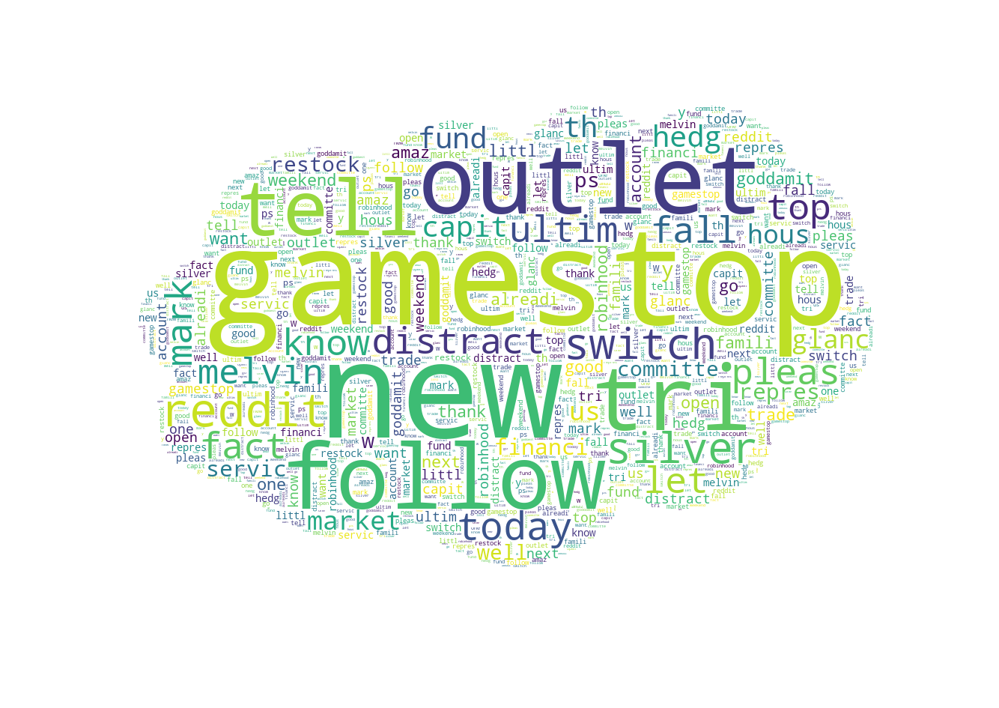

In [411]:
create_wordcloud(gamestop.clean_tweet.values)

#### nGrams

We wanted to see most frequent words group in order to understand the tweets more. 

In [392]:
#Function to ngram
def get_top_n_gram(corpus,ngram_range,n=None):
    vec = CountVectorizer(ngram_range=ngram_range,stop_words = 'english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
#n2_bigram
n2_bigrams = get_top_n_gram(gamestop['clean_tweet'],(2,2),20)
n2_bigrams

[('gamestop stock', 3822),
 ('wall street', 2158),
 ('hedg fund', 1658),
 ('gamestop share', 1549),
 ('gamestop amc', 1223),
 ('gamestop gme', 941),
 ('gamestop saga', 932),
 ('short squeez', 927),
 ('stock market', 899),
 ('buy gamestop', 807),
 ('gme gamestop', 738),
 ('elon musk', 706),
 ('robinhood ceo', 659),
 ('gamestop short', 635),
 ('like gamestop', 615),
 ('gamestop trade', 572),
 ('gamestop reddit', 551),
 ('gme amc', 498),
 ('gamestop frenzi', 470),
 ('amc gamestop', 450)]

In the bigram we can see most frequent groups are the actors of the topic. We can also see Elon Musk and Robinhood ceo which 2 other persons involved to the situation after some time and put flame on it. 

In [393]:
#n3_trigram
n3_trigrams = get_top_n_gram(gamestop['clean_tweet'],(3,3),20)
n3_trigrams

[('gamestop short squeez', 320),
 ('silver new gamestop', 227),
 ('elon musk grill', 197),
 ('musk grill robinhood', 194),
 ('wolf wall street', 194),
 ('buy gamestop stock', 188),
 ('wall street gamestop', 188),
 ('gamestop wall street', 185),
 ('ing leav gamestop', 184),
 ('limit gamestop share', 166),
 ('media launch coordin', 157),
 ('launch coordin fake', 157),
 ('coordin fake news', 157),
 ('fake news stop', 157),
 ('news stop gamestop', 157),
 ('stop gamestop rebellion', 153),
 ('gamestop rebellion feder', 150),
 ('robinhood ceo vlad', 150),
 ('gamestop amc silver', 143),
 ('rais trade limit', 138)]

Silver joined to the list as silver new gamestop and looks like there were 227 tweets which use it. 

In [435]:
gamestop[gamestop.clean_tweet.str.find('silver new gamestop')!= -1].sort_values('fav', ascending = False)

,tweets,date,rt,fav,clean_tweet
21806,Silver is the new Gamestop: Price boosted by o...,2021-02-01 12:12:13,17,91,silver new gamestop price boost onlin movement
9973,Silver is the new GameStop: Metal's price hits...,2021-02-01 18:33:01,15,38,silver new gamestop metal price hit year high...
22053,Silver is the new Gamestop: Price boosted by o...,2021-02-01 11:56:07,4,16,silver new gamestop price boost onlin movement
10875,@GMEshortsqueeze Real tired of seeing “silver ...,2021-02-01 18:07:40,0,14,real tire see “silver new gamestop ” yeah lik...
17126,Silver is the new Gamestop? \n\nhttps://t.co/E...,2021-02-01 15:14:13,3,14,silver new gamestop
...,...,...,...,...,...
17639,Silver the new GameStop (Business) https://t.c...,2021-02-01 15:00:05,0,0,silver new gamestop busi
17665,First Mover: Silver Is the New GameStop as Mus...,2021-02-01 14:59:40,0,0,first mover silver new gamestop musk’ #bitcoin...
17704,First Mover: Silver Is the New GameStop as Mus...,2021-02-01 14:58:16,0,0,first mover silver new gamestop musk’ #bitcoin...
17744,Bubble Watch: Silver is the new GameStop -- Pr...,2021-02-01 14:57:13,0,0,bubbl watch silver new gamestop price reach hi...


In [394]:
#n4_trigram
n4_trigrams = get_top_n_gram(gamestop['clean_tweet'],(4,4),20)
n4_trigrams

[('elon musk grill robinhood', 194),
 ('media launch coordin fake', 157),
 ('launch coordin fake news', 157),
 ('coordin fake news stop', 157),
 ('fake news stop gamestop', 157),
 ('news stop gamestop rebellion', 153),
 ('stop gamestop rebellion feder', 150),
 ('silver new gamestop price', 120),
 ('real wolf wall street', 118),
 ('big buck gamestop stock', 111),
 ('new podcast episod pleas', 109),
 ('podcast episod pleas subscrib', 109),
 ('episod pleas subscrib channel', 108),
 ('musk grill robinhood boss', 107),
 ('grill robinhood boss gamestop', 105),
 ('robinhood boss gamestop row', 105),
 ('new gamestop price boost', 103),
 ('rais trade limit gamestop', 103),
 ('gamestop price boost onlin', 102),
 ('price boost onlin movement', 102)]

We can see the tweets which got the the most favs and retweets.

In [438]:
gamestop.sort_values('rt', ascending=False).head(15)

,tweets,date,rt,fav,clean_tweet
48734,A 20-year-old college student donated multiple...,2021-02-02 04:14:05,11570,92469,year old colleg student donat multipl nintend...
18624,Let’s get these tendies @WSBMod \n@GameStop @A...,2021-02-01 14:30:00,4985,14759,let’ get tendi 🚀 #tendiesyall
3866,Rare photo of the CEO of GameStop https://t.co...,2021-02-01 21:42:51,4382,101941,rare photo ceo gamestop
13311,GameStop Investors Are Paying It Forward By Do...,2021-02-01 17:00:07,4169,21545,gamestop investor pay forward donat nintendo s...
27023,20-year-old Hunter Kahn made nearly $30K off G...,2021-02-02 22:13:34,3167,20376,year old hunter kahn made nearli k gamestop s...
6373,We are not F***ing Leaving (GAMESTOP) https://...,2021-02-01 20:24:04,2172,7856,f ing leav gamestop via
32930,I have questions for @RobinhoodApp on why they...,2021-02-02 18:07:19,1457,8261,question restrict gamestop trade chang rule in...
5586,"Bitcoin could be the new GameStop, as hedge fu...",2021-02-01 20:47:37,1409,6307,bitcoin could new gamestop hedg fund ramp shor...
12046,Noah Centineo has been cast in an untitled fil...,2021-02-01 17:38:04,1149,10108,noah centineo cast untitl film wall street cha...
49306,The hedge funds didn’t learn their lesson with...,2021-02-02 03:38:42,913,6824,hedg fund didn’t learn lesson gamestop gme sta...


In [439]:
gamestop.sort_values('fav', ascending=False).head(15)

,tweets,date,rt,fav,clean_tweet
3866,Rare photo of the CEO of GameStop https://t.co...,2021-02-01 21:42:51,4382,101941,rare photo ceo gamestop
48734,A 20-year-old college student donated multiple...,2021-02-02 04:14:05,11570,92469,year old colleg student donat multipl nintend...
13311,GameStop Investors Are Paying It Forward By Do...,2021-02-01 17:00:07,4169,21545,gamestop investor pay forward donat nintendo s...
27023,20-year-old Hunter Kahn made nearly $30K off G...,2021-02-02 22:13:34,3167,20376,year old hunter kahn made nearli k gamestop s...
48273,@barstoolsports Biggest twist was that she’s 2...,2021-02-02 04:53:42,902,17066,biggest twist she’ would bet gamestop share ...
18624,Let’s get these tendies @WSBMod \n@GameStop @A...,2021-02-01 14:30:00,4985,14759,let’ get tendi 🚀 #tendiesyall
12046,Noah Centineo has been cast in an untitled fil...,2021-02-01 17:38:04,1149,10108,noah centineo cast untitl film wall street cha...
4957,Following up on my commitment to buy $50k of G...,2021-02-01 21:06:30,316,9985,follow commit buy k gamestop stock commun dare...
32930,I have questions for @RobinhoodApp on why they...,2021-02-02 18:07:19,1457,8261,question restrict gamestop trade chang rule in...
6373,We are not F***ing Leaving (GAMESTOP) https://...,2021-02-01 20:24:04,2172,7856,f ing leav gamestop via


### Feature Extraction

We decided to continue with extracting hashtags and users to have more insights from tweets

In [578]:
# who is being tweeted at/mentioned 
# what hashtags are being used

def find_mentioned(tweet):
    '''This function will extract the twitter handles of people mentioned in the tweet'''
    return re.findall('(?<!RT\s)(@[A-Za-z]+[A-Za-z0-9-_]+)', tweet)  

def find_hashtags(tweet):
    '''This function will extract hashtags'''
    return re.findall('(#[A-Za-z]+[A-Za-z0-9-_]+)', tweet) 

# make new columns for mentioned usernames and hashtags
gamestop['mentioned'] = gamestop.tweets.apply(find_mentioned)
gamestop['hashtags'] = gamestop.tweets.apply(find_hashtags)


In [579]:
gamestop

,tweets,date,rt,fav,clean_tweet,mentioned,hashtags
0,If any news outlet you follow tried to tell yo...,2021-02-01 23:59:58,0,2,news outlet follow tri tell reddit switch game...,[],[]
1,Did GameStop Mark the Top? | @Hedge_Your_Risk ...,2021-02-01 23:59:58,0,1,gamestop mark top,[@Hedge_Your_Risk],[]
2,Don't let this distract you from the fact that...,2021-02-01 23:59:55,2,4,let distract fact ultim fall melvin capit hedg...,[],[]
3,Overnight News: #Robinhood raises another $2.4...,2021-02-01 23:59:53,0,0,overnight news #robinhood rais anoth bn inves...,[],"[#Robinhood, #GameStop]"
4,Tmrw's guest to discuss GameStop and Robinhood...,2021-02-01 23:59:52,0,0,tmrw guest discuss gamestop robinhood,[],[]
...,...,...,...,...,...,...,...
49995,@JanetYellen It's a shame you have nothing to ...,2021-02-02 02:56:40,1,1,shame noth day crimin shorter hedg fund wreak...,[@JanetYellen],[]
49996,Not going to lie. I think perhaps the funnest ...,2021-02-02 02:56:38,0,0,go lie think perhap funnest thing happen year ...,[],[]
49997,Markets at a Glance 02.01.21 https://t.co/Zgn6...,2021-02-02 02:56:29,0,0,market glanc us hous repres financi servic ...,[],[]
49998,Well GameStop when y’all restocking on PS5’s g...,2021-02-02 02:56:25,0,0,well gamestop y’all restock ps’ goddamit littl...,[],[]


Add same/similiar for mentioned also

Add cloud for most keywords in tweets mentioned hashtags group by date

In [87]:
# take the rows from the hashtag columns where there are actually hashtags

hashtags_list_gamestop = gamestop.loc[
                       gamestop.hashtags.apply(
                           lambda hashtags_list: hashtags_list !=[]
                       ),['hashtags']]

# create dataframe where each use of hashtag gets its own row
flattened_hashtags_gamestop = pd.DataFrame(
    [hashtag for hashtags_list in hashtags_list_gamestop.hashtags
    for hashtag in hashtags_list],
    columns=['hashtag'])

flattened_hashtags_gamestop

,hashtag
0,#Robinhood
1,#GameStop
2,#nyse
3,#closingbell
4,#wallstreet
...,...
20851,#Wallstreetbets
20852,#Silver
20853,#GameStop
20854,#gme


In [124]:
flattened_hashtags_gamestop.hashtag = flattened_hashtags_gamestop.hashtag.str.upper()
# count of appearances of each hashtag
flattened_hashtags_gamestop.hashtag = flattened_hashtags_gamestop.hashtag.str.upper()
popular_hashtags = flattened_hashtags_gamestop.groupby('hashtag').size().reset_index(name='counts')                                        .sort_values('counts', ascending=False)                                        .reset_index(drop=True)
popular_hashtags

,hashtag,counts
0,#GAMESTOP,4699
1,#GME,1279
2,#AMC,639
3,#WALLSTREETBETS,514
4,#ROBINHOOD,490
...,...,...
3250,#HANALLENHEDGE,1
3251,#HAPPENINGNOW,1
3252,#HAPPY,1
3253,#HAPPYBIRTHDAYHARRY,1


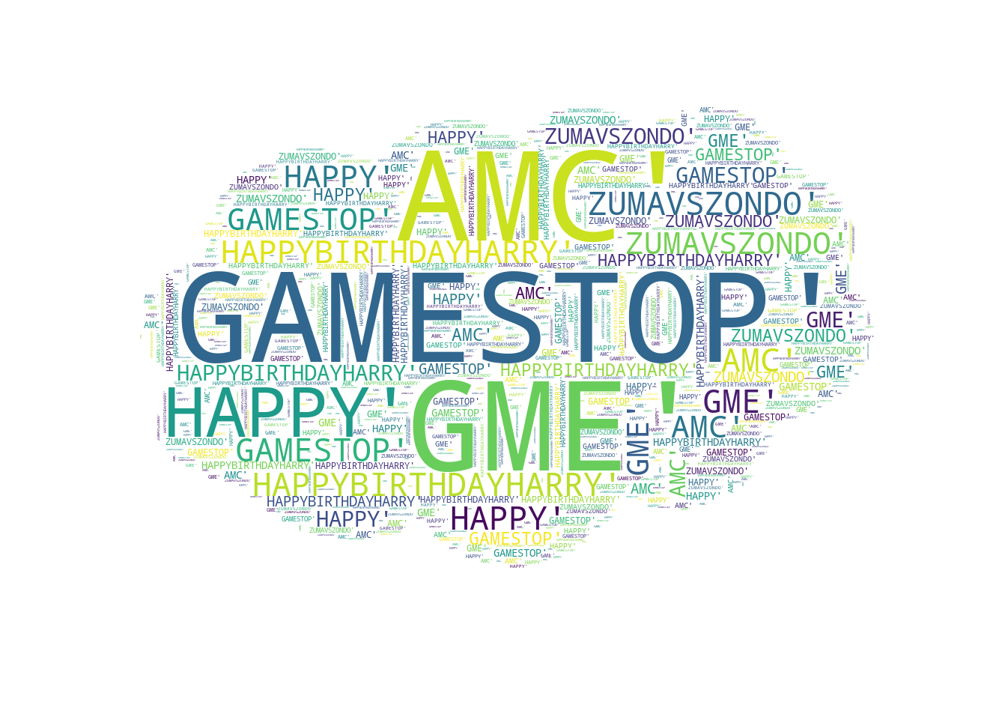

In [441]:
create_wordcloud(popular_hashtags.hashtag.values)

We decided to check how hashtags are correlated with eachother. And since there are plenty hashtags we only showed top 15 correlation.

In [457]:
# take hashtags which appear at least this amount of times
min_appearance = 50
# find popular hashtags - make into python set for efficiency
popular_hashtags_set = set(popular_hashtags[
                           popular_hashtags.counts>=min_appearance
                           ]['hashtag'])


# make a new column with only the popular hashtags
hashtags_list_gamestop['popular_hashtags'] = hashtags_list_gamestop.hashtags.apply(
            lambda hashtag_list: [hashtag for hashtag in hashtag_list
                                  if hashtag in popular_hashtags_set])
# drop rows without popular hashtag
popular_hashtags_list_gamestop = hashtags_list_gamestop.loc[
            hashtags_list_gamestop.popular_hashtags.apply(lambda hashtag_list: hashtag_list !=[])]



# make new dataframe
hashtag_vector_gamestop = popular_hashtags_list_gamestop.loc[:, ['popular_hashtags']]

for hashtag in popular_hashtags_set:
    # make columns to encode presence of hashtags
    hashtag_vector_gamestop['{}'.format(hashtag)] = hashtag_vector_gamestop.popular_hashtags.apply(
        lambda hashtag_list: int(hashtag in hashtag_list))
    
hashtag_matrix = hashtag_vector_gamestop.drop('popular_hashtags', axis=1)

def get_redundant_pairs(df):
    '''Get diagonal and lower triangular pairs of correlation matrix'''
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop


def get_top_abs_correlations(df, n=5):
    au_corr = df.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    au_corr = au_corr.dropna()
    return au_corr[0:n]

get_top_abs_correlations(hashtag_matrix,15)

#PURPLEPOWER    #LALATE            0.846281
#STOCKS         #SILVER            0.563823
#HOLDTHELINE    #GAMESTONK         0.499499
#TOTHEMOON      #REDDIT            0.499499
#STONKS         #STOCKMARKET       0.499499
#TRADING        #ROBINHOOD         0.384573
#TOTHEMOON      #WALLSTREETBETS    0.377207
#GME            #AMC               0.303482
#LALATE         #GME               0.240252
#SILVERSQUEEZE  #WALLSTREETBETS    0.215883
#GAMESTOP       #TRADING           0.210976
#PURPLEPOWER    #GME               0.203321
#REDDIT         #WALLSTREETBETS    0.186137
#STOCK          #ROBINHOOD         0.179944
#XRP            #GME               0.175884
dtype: float64

In [652]:
# take the rows from the hashtag columns where there are actually hashtags

mentioned_list_gamestop = gamestop.loc[
                       gamestop.mentioned.apply(
                           lambda mentioned_list: mentioned_list !=[]
                       ),['mentioned']]

# create dataframe where each use of hashtag gets its own row
flattened_mentioned_gamestop = pd.DataFrame(
    [mentioned for mentioned_list in mentioned_list_gamestop.mentioned
    for mentioned in mentioned_list],
    columns=['mentioned'])

flattened_mentioned_gamestop.mentioned = flattened_mentioned_gamestop.mentioned.str.upper()
# count of appearances of each hashtag
flattened_mentioned_gamestop.mentioned = flattened_mentioned_gamestop.mentioned.str.upper()
popular_mentioned = flattened_mentioned_gamestop.groupby('mentioned').size().reset_index(name='counts')                                        .sort_values('counts', ascending=False)                                        .reset_index(drop=True)
popular_mentioned

,mentioned,counts
0,@GAMESTOP,2745
1,@YOUTUBE,1306
2,@AMCTHEATRES,875
3,@WSBMOD,842
4,@POPEYESCHICKEN,699
...,...,...
10824,@HUNREASONABLE,1
10825,@HUNTERBOYLAN,1
10826,@HUNTERINII,1
10827,@HUNTERKAHN,1


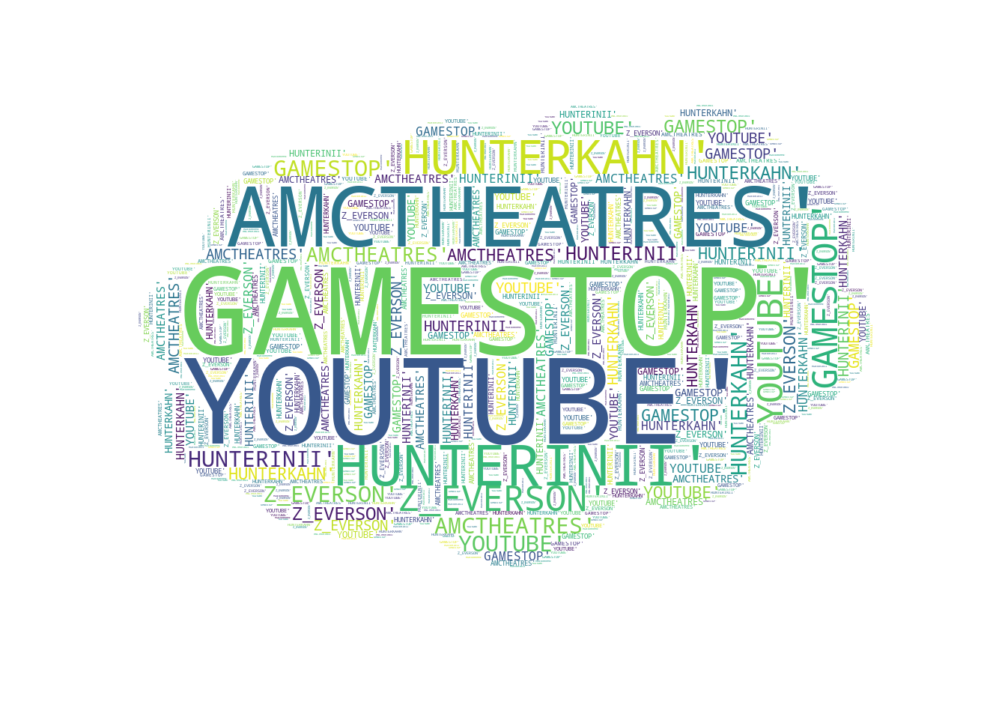

In [654]:
create_wordcloud(popular_mentioned.mentioned.values)

## Topic Modeling

We continue with topic modeling in order to find out if the tweets have some hidden variables that we are not observing. In order to achieve that we used NLTK library to vectorize the tweets and LatentDirichletAllocation package from sklearn library to do the modelling

In [471]:

# the vectorizer object will be used to transform text to vector form
vectorizer = CountVectorizer(max_df=0.9, min_df=25, token_pattern='\w+|\$[\d\.]+|\S+')

# apply transformation
tf = vectorizer.fit_transform(gamestop['clean_tweet']).toarray()

# tf_feature_names tells us what word each column in the matric represents
tf_feature_names = vectorizer.get_feature_names()


In [472]:

number_of_topics = 5

model = LatentDirichletAllocation(n_components=number_of_topics, random_state=0)

In [473]:
model.fit(tf)

LatentDirichletAllocation(n_components=5, random_state=0)

In [474]:
def display_topics(model, feature_names, no_top_words):
    topic_dict = {}
    for topic_idx, topic in enumerate(model.components_):
        topic_dict["Topic %d words" % (topic_idx)]= ['{}'.format(feature_names[i])
                        for i in topic.argsort()[:-no_top_words - 1:-1]]
        topic_dict["Topic %d weights" % (topic_idx)]= ['{:.1f}'.format(topic[i])
                        for i in topic.argsort()[:-no_top_words - 1:-1]]
    return pd.DataFrame(topic_dict)


In [475]:
no_top_words = 20
display_topics(model, tf_feature_names, no_top_words)

,Topic 0 words,Topic 0 weights,Topic 1 words,Topic 1 weights,Topic 2 words,Topic 2 weights,Topic 3 words,Topic 3 weights,Topic 4 words,Topic 4 weights
0,gamestop,5848.8,#gamestop,4388.2,gamestop,4711.6,gamestop,10753.8,gamestop,6656.1
1,…,2968.9,gamestop,4340.7,short,3151.2,…,9022.0,via,2031.0
2,silver,2380.0,’,2575.9,…,2822.4,stock,2907.1,…,1913.2
3,reddit,1752.4,…,2452.6,fund,1860.0,trade,1746.0,robinhood,1419.9
4,wall,1726.7,gme,2146.0,hedg,1765.6,buy,1603.5,stock,1281.5
5,street,1713.9,hold,1321.4,squeez,1378.2,share,1599.0,reddit,855.1
6,stock,1515.1,#gme,1217.0,stock,1203.0,like,1582.2,musk,818.9
7,week,1321.6,stock,1156.2,share,673.3,market,1492.3,ceo,811.7
8,movi,1201.5,buy,1095.9,gme,590.9,peopl,1434.9,’,787.1
9,retail,1092.8,it,1068.0,capit,552.2,’t,1341.1,elon,767.6


Topic 0 --> It looks like this topic is about "Silver is the new GameStop" "Silver is the new target for Reddit traders"  
Topic 1 --> It looks like this topic is about #wallstreetbets are holding the stocks of gamestop and also buying AMC Entertainment stock as well.  
Topic 2 --> It looks like this topic is about the people who short the GME and hedge funds are losing a lot of money especially Melvin capital.  
Topic 3 --> It looks like this topic is about explaining what is the situation about in general.  
Topic 4 --> It looks like this topic is about Ellon Musk's tweet,support to #wallstreetbets and how Robinhood blocked purchase of GameStop and AMC stock.  

## Sentiment Analysis

We decided to check sentiment of the tweets in order to check if there is some correlation between stock price and sentiments of tweets. 

In [476]:
# sentiment analysis
###
###
###
# VADER is a VALENCE based sentiment analyzer
# Valence based approach taken into consideration the "intensity" of a word as opposed to only the polarity (+ve or -ve). For ex. "Great" is more treated as more +ve as opposed to "Good"
# suggested scale
# Neutral -0.5 < and > 0.5
# Positive >=0.5
# Negative <=-0.5

import nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer

analyser = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Can\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [580]:
%%time

def vader_sentiment(sentences):
    i=0 # counter

    compval1 = [ ] # empty list to hold our computed 'compound' VADER scores
    predicted_value = [ ] # empty series to hold our predicted values

    while (i<len(sentences)):

        k = analyser.polarity_scores(sentences.iloc[i]['clean_tweet'])
        compval1.append(k['compound'])
        if ((k['compound'] >= 0.5)):
            predicted_value.append('positive')
        elif ((k['compound'] > -0.5) & (k['compound'] < 0.5)):
            predicted_value.append('neutral')
        elif ((k['compound'] <= -0.5)):
            predicted_value.append('negative')

        i = i+1
    return compval1, predicted_value



gamestop['VADER_score'], gamestop['sentiment'] = vader_sentiment(gamestop)

Wall time: 40.8 s


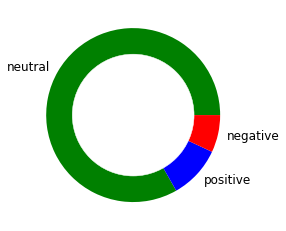

In [619]:
total=gamestop.loc[:,"sentiment"].value_counts(dropna=False)
percentage=round(gamestop.loc[:,"sentiment"].value_counts(dropna=False,normalize=True)*100,2)
pichart = pd.concat([total,percentage],axis=1,keys=['Total','Percentage'])
names= pichart.index
size=pichart["Percentage"]
 
# Create a circle for the center of the plot
my_circle=plt.Circle( (0,0), 0.7, color='white')
plt.pie(size, labels=names, colors=['green','blue','red'])
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

Looks like most of the tweets has neutral sentiment.

We decided create another column from dates and have them grouped by 5 minutes in order to compare with stock price.

In [604]:
def ftmin(text):
    if int(text[-4]) < 5:
        return text.replace(text[-8:], text[-8:-4]+'0:00')
    else:
        return text.replace(text[-8:], text[-8:-4]+'5:00')

In [611]:
gamestop["date5m"] = gamestop.date.apply(lambda x: ftmin(str(x)))

In [626]:
gspdf = gamestop.groupby("date5m").sum()
gspdf

We used yahoofinance to recieve data with 5 minute interval for 2 days.

In [649]:
import yfinance as yf

gmest = yf.download("GME", "2021-01-30", "2021-02-03", interval="5m")
gmest["Date"] = gmest.index
gmest["Change"] = gmest.Close.pct_change()

[*********************100%***********************]  1 of 1 completed


In [647]:
# Using plotly.express
import plotly
plotly.offline.init_notebook_mode()

fig = plotly.express.line(gspdf, x=gspdf.index, y="VADER_score", title= "Sentiment")
fig.show()
fig = plotly.express.line(gmest, x='Date', y="Close", title= "GME Stock")
fig.show()

In [651]:
import plotly.graph_objects as go

# Create traces
fig = go.Figure()
fig.add_trace(go.Scatter(x=gspdf.index, y=gspdf.VADER_score,
                    mode='lines',
                    name='lines'))
fig.add_trace(go.Scatter(x=gmest.Date, y=gmest.Close,
                    mode='lines+markers',
                    name='lines+markers'))

fig.show()

It appeared there is no conntection between sentiments of tweet with stock price.

In [639]:
gspdf_count =  gamestop.groupby("date5m").count()

In [640]:
# Using plotly.express
import plotly
plotly.offline.init_notebook_mode()

fig = plotly.express.line(gspdf_count, x=gspdf_count.index, y="tweets", title= "The Amount of Tweets per 5 Minutes")
fig.show()
fig = plotly.express.line(gspdf, x=gspdf.index, y="fav", title= "The Amount of Favs")
fig.show()
fig = plotly.express.line(gspdf, x=gspdf.index, y="rt", title= "The Amount of RTs")
fig.show()


In [622]:
positive_tweets = gamestop[gamestop.sentiment=="positive"]
negative_tweets = gamestop[gamestop.sentiment=="negative"]

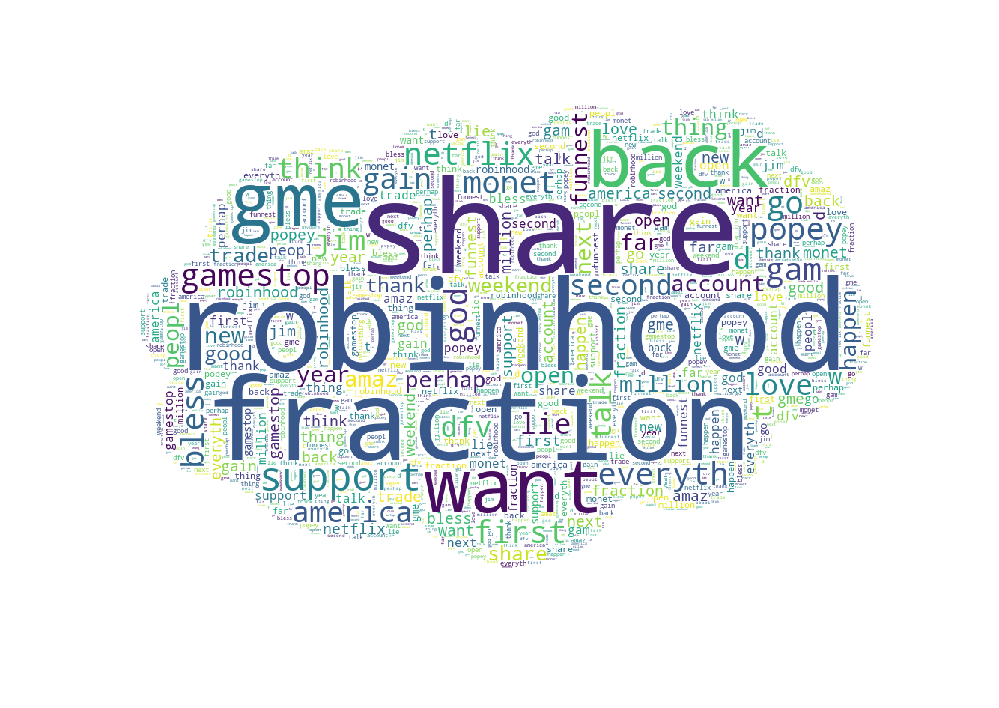

In [624]:
create_wordcloud(positive_tweets.clean_tweet.values)

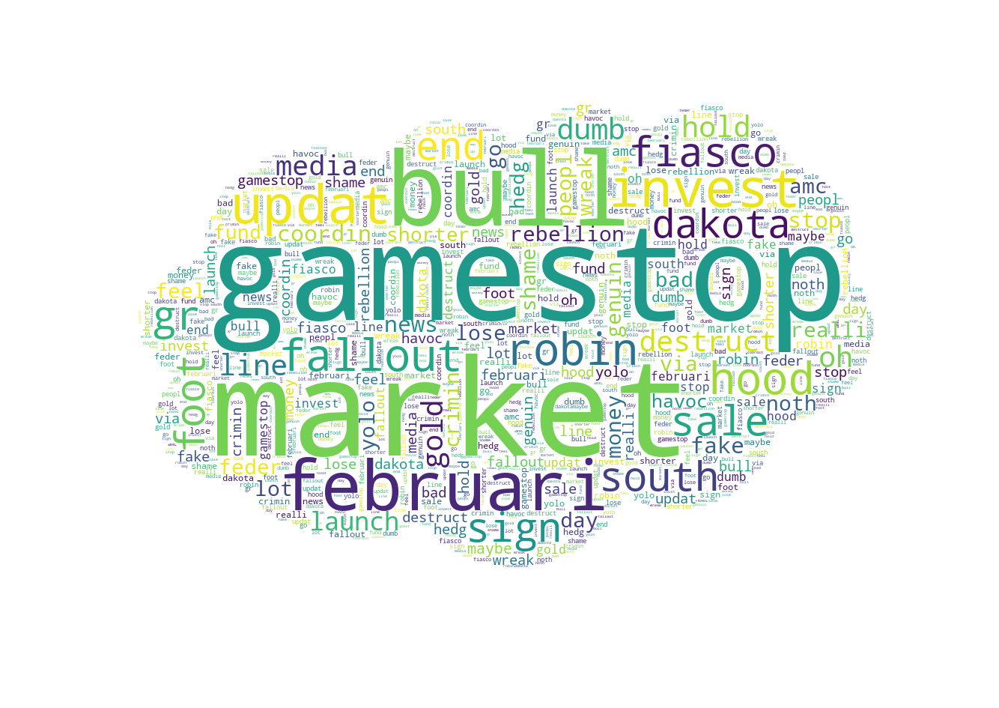

In [623]:
create_wordcloud(negative_tweets.clean_tweet.values)

### Conclusion

In this analysis, we pull tweets from twitter and make some Exploratory Data Analysis. After doing some cleaning and preprossesing we tried to extract more information from tweets. Ngrams and keyword analysis helped us to understand the tweets. Topic modeling was very successful with LDA method we manage to find 5 topics and get insights of the story. In the sentiment analysis part, unfortunately we could not catch the correlation as we expected. However, in general, we were able to make sense of the tweets on the subject.